# Packages

In [1]:
from tqdm.autonotebook import tqdm as notebook_tqdm
import synloc as s
import matplotlib.pyplot as plt
import seaborn as sns # for kde plots
import pandas as pd
from sklearn.datasets import fetch_california_housing
import statsmodels.api as sm
from statsmodels.iolib.summary2 import summary_col
from sdv.metrics.tabular import KSComplement, CorrelationSimilarity
from sdv.single_table import GaussianCopulaSynthesizer, CTGANSynthesizer, TVAESynthesizer
from sdv.metadata import Metadata
notebook_tqdm.pandas()
import subprocess, json
# I set randomness as computer scientists convention: 42
import numpy as np
np.random.seed(42)

C:\Users\mq10007470\AppData\Local\Temp\ipykernel_45616\247868441.py:1: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm as notebook_tqdm


## Dependencies for replication

Here is the dependency versions for this notebook: 

In [2]:
!pip freeze

anonymeter @ file:///C:/Users/mq10007470/OneDrive%20-%20Macquarie%20University/Desktop/anonymeter
anyio==4.10.0
argon2-cffi==25.1.0
argon2-cffi-bindings==25.1.0
arrow==1.3.0
asttokens @ file:///C:/b/abs_9662ywy9fp/croot/asttokens_1743630464377/work
async-lru==2.0.5
attrs==25.3.0
babel==2.17.0
beautifulsoup4==4.13.5
bleach==6.2.0
boto3==1.40.36
botocore==1.40.36
certifi==2025.8.3
cffi==2.0.0
charset-normalizer==3.4.3
cloudpickle==3.1.1
colorama @ file:///C:/Users/dev-admin/perseverance-python-buildout/croot/colorama_1729036581634/work
comm==0.2.3
contourpy==1.3.3
copulas==0.12.3
ctgan==0.11.0
cycler==0.12.1
debugpy==1.8.17
decorator @ file:///C:/miniconda3/conda-bld/decorator_1757341249916/work
deepecho==0.7.0
defusedxml==0.7.1
executing @ file:///C:/miniconda3/conda-bld/executing_1757061255268/work
Faker==37.8.0
fastjsonschema==2.21.2
filelock==3.19.1
fonttools==4.60.0
fqdn==1.5.1
fsspec==2025.9.0
graphviz==0.21
h11==0.16.0
httpcore==1.0.9
httpx==0.28.1
idna==3.10
ipykernel==6.30.1
ipy

# Overview 

The Local resampler is expected to perform well on convex distributions. Therefore, non-convex distributions which are clustered around different spaces are selected for the simulation purpose. We first simulate the following distribution:
$$
\begin{aligned}
    u_{j,i} &\sim Normal(0, 1),  \\
    x_i &\sim r_i * \cos{a_i} + u_{1,i},\\
    y_i &\sim 0.5 x_i - 0.05 x_i^2 + r_i * \sin{a_i} + u_{2,i},
\end{aligned}
$$

where $r_i$ is 8 or 20 with same probability, and $a_i$ is drawn from a uniform distribution with lower and upper bounds, 0 and $ 2\pi$, respectively. 

The second data generating process is: 

## Data Generating Process

<Figure size 1500x1500 with 0 Axes>

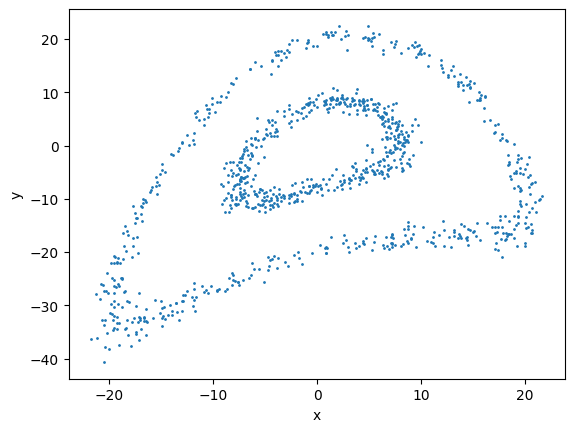

In [3]:
data = s.sample_circulars_xy(1000)
data.to_csv('circulars.csv', index=False)
# I save this data to be replicated using `synthpop` in R
fig = plt.figure(figsize=(5, 5), dpi=300)
data.plot.scatter(x='x', y='y', alpha=1, s=1)
plt.savefig('../../img/original_circulars.png', dpi=1000)
plt.show()

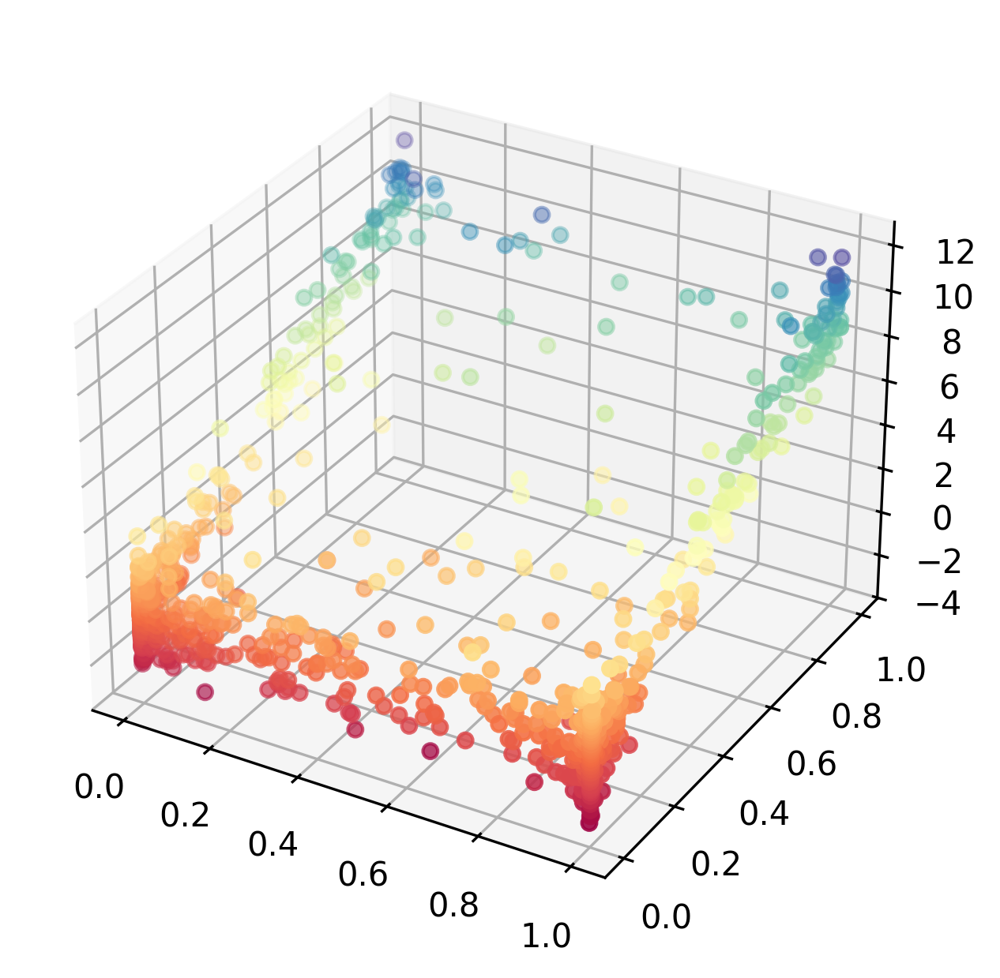

In [4]:
data2 = s.sample_trivariate_xyz(1000)
data2.to_csv('trivariate.csv', index=False)
# I save this data to be replicated using `synthpop` in R
fig2 = plt.figure(figsize=(5, 5), dpi=300)
ax = fig2.add_subplot(111, projection='3d')
ax.scatter(data2['x'], data2['y'], data2['z'], c=data2['z'], cmap='Spectral')
plt.savefig('../../img/original_disvariate.png', dpi=1000)
plt.show()

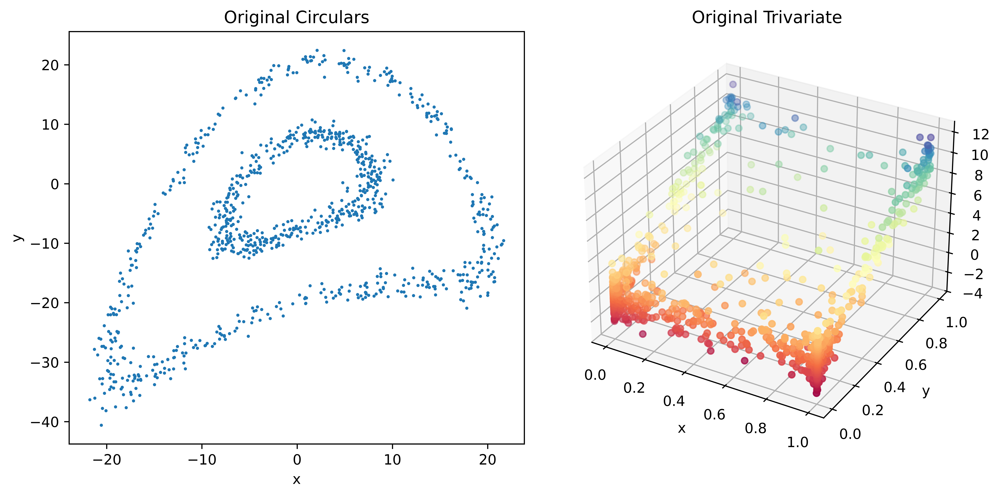

In [5]:
fig = plt.figure(figsize=(10, 5), dpi=1000)
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122, projection='3d')
ax1.scatter(data['x'], data['y'], s = 1.5)
ax2.scatter(data2['x'], data2['y'], data2['z'], c=data2['z'], cmap="Spectral")
ax1.set_title('Original Circulars')
ax2.set_title('Original Trivariate')
ax1.set_xlabel('x')
ax1.set_ylabel('y')
ax2.set_xlabel('x')
ax2.set_ylabel('y')
ax2.set_zlabel('z')
plt.tight_layout()
plt.savefig('../../img/original_sims.png', format='png')
plt.show()

## Generating Synthetic Data

### Bivariate DGP

Generating 1000 synthetic samples using 16 cores...


Generating synthetic samples: 100%|██████████| 1000/1000 [00:20<00:00, 48.41it/s]


Synthetic sample generation complete.


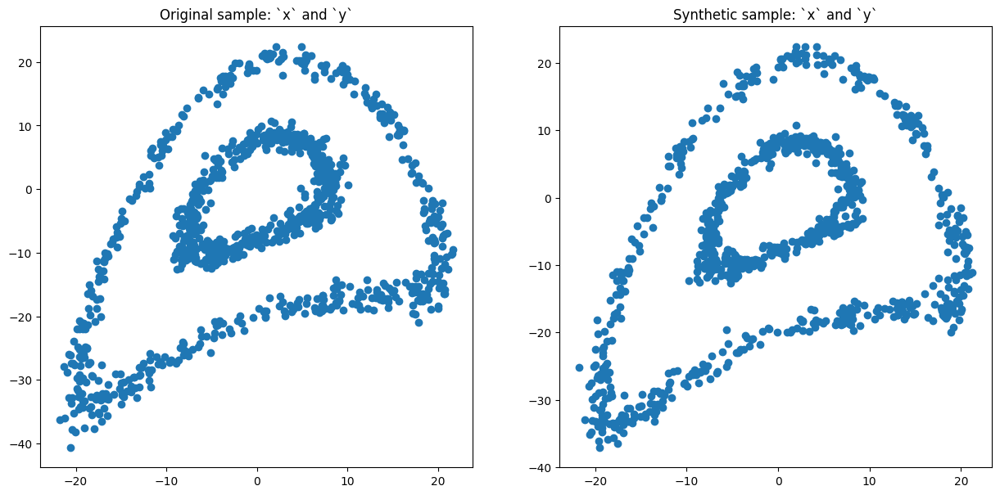

In [6]:
plt.Figure(dpi=300)
syn_loc_cov = s.LocalCov(data, K=15, normalize=True)
syn_loc_cov.fit()
syn_loc_cov.comparePlots(['x', 'y'])

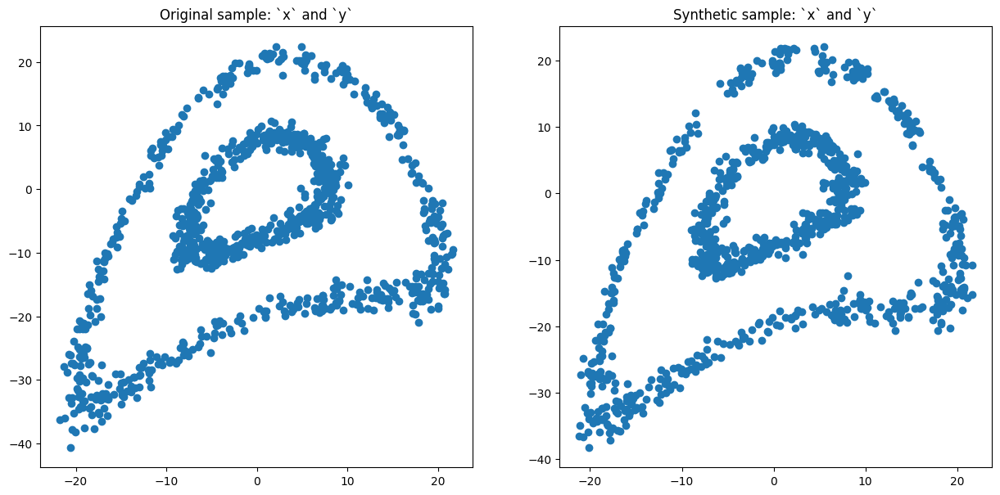

In [7]:
plt.Figure(dpi=300)
syn_clu_cov = s.clusterCov(data, n_clusters=50, size_min=10, normalize=True)
syn_clu_cov.fit()
syn_clu_cov.comparePlots(['x', 'y'])

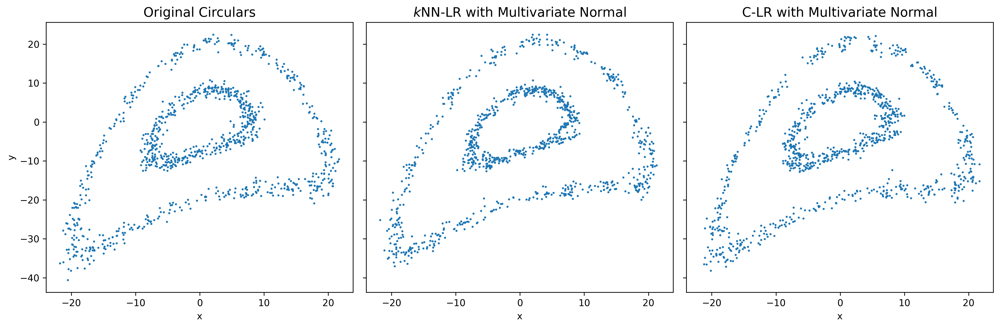

In [8]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5), sharex=True, sharey=True, dpi=300)
axs[0].scatter(data.x, data.y, s=1.5)
axs[0].set_title('Original Circulars', fontsize=14)
axs[1].scatter(syn_loc_cov.synthetic.x, syn_loc_cov.synthetic.y, s=1.5)
axs[1].set_title('$k$NN-LR with Multivariate Normal' , fontsize=14)
axs[2].scatter(syn_clu_cov.synthetic.x, syn_clu_cov.synthetic.y, s=1.5)
axs[2].set_title('C-LR with Multivariate Normal', fontsize=14)
axs[2].set_xlabel('x')
axs[1].set_xlabel('x')
axs[0].set_xlabel('x')
axs[0].set_ylabel('y')
plt.tight_layout()
plt.savefig('../../img/circulars_syn.png', format='png')
# share y axis
plt.show()


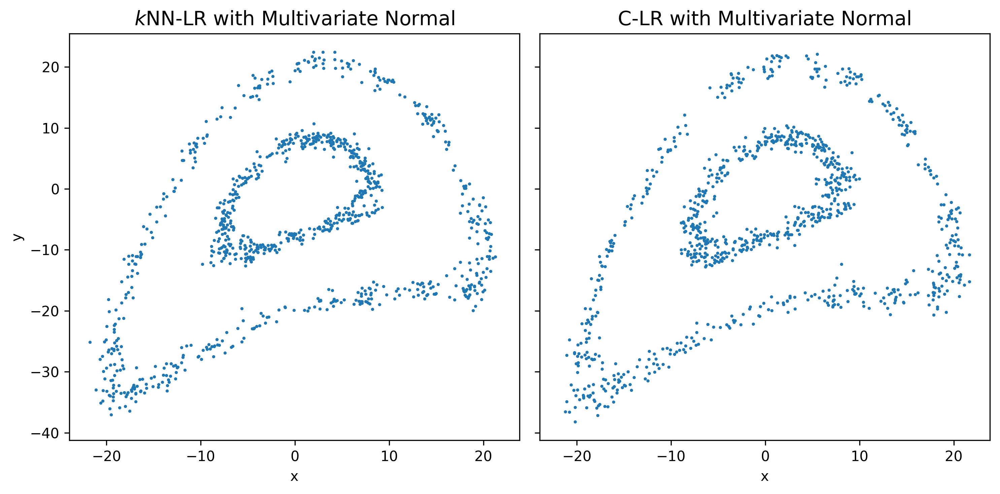

In [9]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5), sharex=True, sharey=True, dpi=300)
axs[0].scatter(syn_loc_cov.synthetic.x, syn_loc_cov.synthetic.y, s=1.5)
axs[0].set_title('$k$NN-LR with Multivariate Normal', fontsize=14)
axs[1].scatter(syn_clu_cov.synthetic.x, syn_clu_cov.synthetic.y, s=1.5)
axs[1].set_title('C-LR with Multivariate Normal', fontsize=14)
axs[1].set_xlabel('x')
axs[0].set_xlabel('x')
axs[0].set_ylabel('y')
plt.tight_layout()
plt.savefig('../../img/circulars_syn_double.png', format='png')
plt.show()


### Trivariate DGP

Figure reff shows that noncovex distributions can be replicated quite well with locally estimated distributions, even though synthetic values are drawn from the multivariate normal distribution. Note that, we use $k=20$ to estimate each distribution whereas this is a bivariate sample. It is possible to replicate original sample more accurately with smaller $k$.

The next simulation generates a trivariate sample as follows:

$$
\begin{aligned}
x_i &\sim Beta(0.1,\,0.1),\\
y_i &\sim Beta(0.1,\, 0.5),\\
z_i &\sim 10 * y_i + u_i,
\end{aligned}
$$

where $u_i$ is drawn from a standard normal distribution. Again, we locally estimate multivariate normal distribution with $k=20$ and draw synthetic values from the estimated distributions. 

Generating 1000 synthetic samples using 16 cores...


Generating synthetic samples: 100%|██████████| 1000/1000 [00:01<00:00, 516.19it/s]


Synthetic sample generation complete.


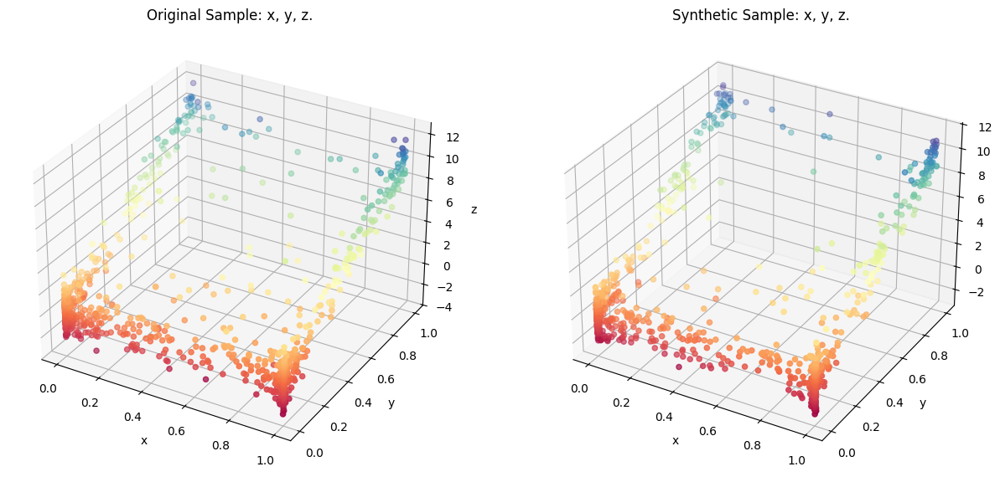

In [10]:
plt.Figure(dpi=300)
syn_loc_cov2 = s.LocalCov(data2, K = 15)
syn_loc_cov2.fit()
syn_loc_cov2.comparePlots(['x', 'y', 'z'])

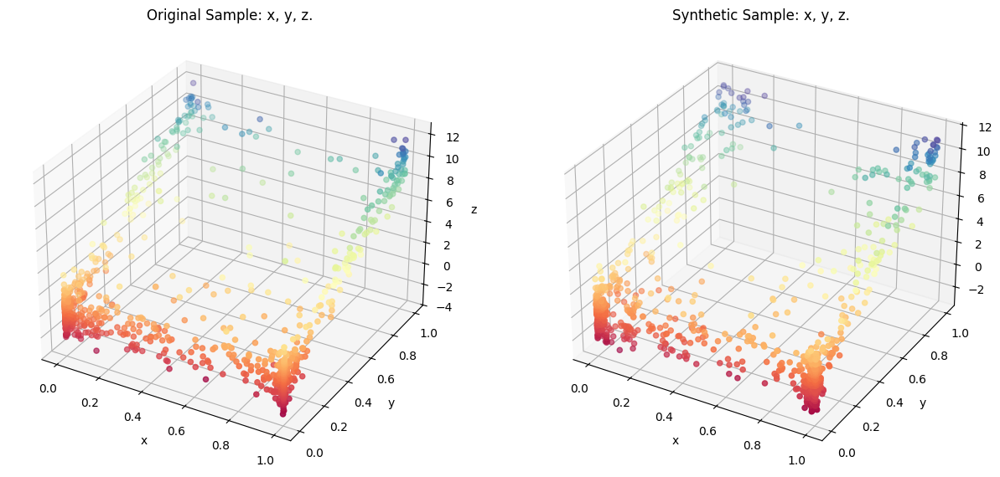

In [11]:
plt.Figure(dpi=300)
syn_clu_cov2 = s.clusterCov(data2, n_clusters=50, size_min=10)
syn_clu_cov2.fit()
syn_clu_cov2.comparePlots(['x', 'y', 'z'])

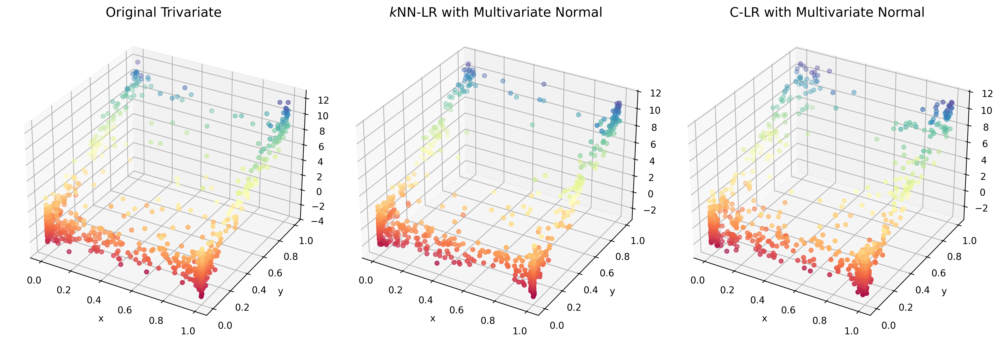

In [12]:
fig = plt.figure(figsize=(15, 5), dpi=300)
ax1 = fig.add_subplot(131, projection='3d')
ax2 = fig.add_subplot(132, projection='3d')
ax3 = fig.add_subplot(133, projection='3d')
ax1.scatter(data2.x, data2.y, data2.z, c = data2.z, cmap='Spectral')
ax2.scatter(syn_loc_cov2.synthetic.x, syn_loc_cov2.synthetic.y, syn_loc_cov2.synthetic.z, c = syn_loc_cov2.synthetic.z, cmap='Spectral')
ax3.scatter(syn_clu_cov2.synthetic.x, syn_clu_cov2.synthetic.y, syn_clu_cov2.synthetic.z, c = syn_clu_cov2.synthetic.z, cmap='Spectral')
ax1.set_xlabel('x')
ax1.set_ylabel('y')
ax1.set_zlabel('z')
ax2.set_xlabel('x')
ax2.set_ylabel('y')
ax2.set_zlabel('z')
ax3.set_xlabel('x')
ax3.set_ylabel('y')
ax3.set_zlabel('z')
ax1.set_title('Original Trivariate', fontsize=14)
ax2.set_title('$k$NN-LR with Multivariate Normal', fontsize=14)
ax3.set_title('C-LR with Multivariate Normal', fontsize=14)
plt.tight_layout()
plt.savefig('../../img/trivariate_syn.png', format='png')
plt.show()

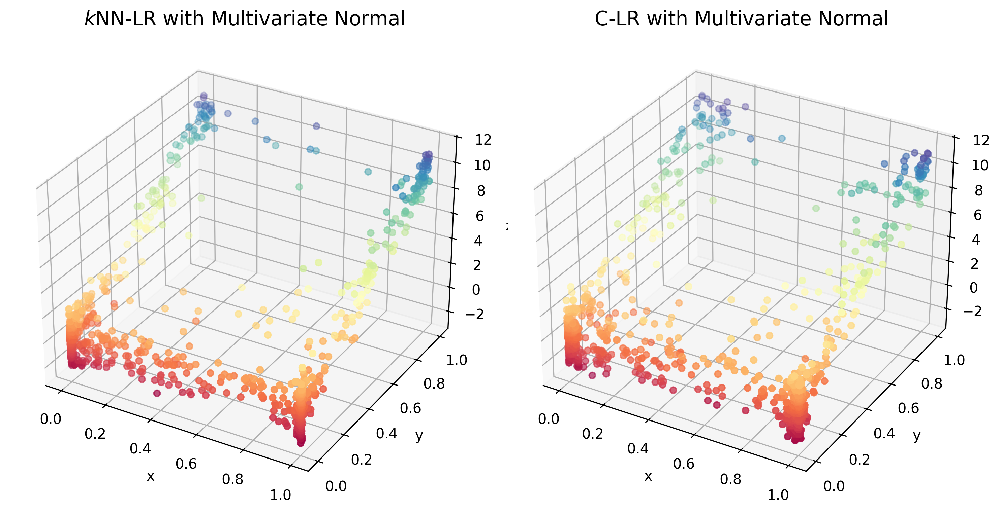

In [13]:
fig = plt.figure(figsize=(10, 5), dpi=300)
ax2 = fig.add_subplot(121, projection='3d')
ax3 = fig.add_subplot(122, projection='3d')
ax2.scatter(syn_loc_cov2.synthetic.x, syn_loc_cov2.synthetic.y, syn_loc_cov2.synthetic.z, c = syn_loc_cov2.synthetic.z, cmap='Spectral')
ax3.scatter(syn_clu_cov2.synthetic.x, syn_clu_cov2.synthetic.y, syn_clu_cov2.synthetic.z, c = syn_clu_cov2.synthetic.z, cmap='Spectral')
ax2.set_xlabel('x')
ax2.set_ylabel('y')
ax2.set_zlabel('z')
ax3.set_xlabel('x')
ax3.set_ylabel('y')
ax3.set_zlabel('z')
ax2.set_title('$k$NN-LR with Multivariate Normal', fontsize=14)
ax3.set_title('C-LR with Multivariate Normal', fontsize=14)
plt.tight_layout()
plt.savefig('../../img/trivariate_syn_double.png', format='png')
plt.show()


Original sample has clusters around the corners. Local resamplers can replicate the original clustered sample quite well again. Replicating both samples, otherwise, should require computationally heavy-burden algorithms or nonparametric distributions which often require well hyperparameter-tuning. 

### Discrete DGP

I create another DGP to showcase: 

1. make privacy assessment. Both real-data applicaiton and previous DGP were basically continuous variables. I will create another simulation to make privacy risk assessment. The risk typically stems from the presence of such discrete variables. 
2. I will also use this simulation to showcase limitations stem from the presence of mixed-type data sets.   

In [14]:
def generate_simple_priv(n=10_000, seed=0):
    rng = np.random.default_rng(seed)

    # Outlier flag (3%)
    G = rng.choice([0, 1], size=n, p=[0.97, 0.03])

    # Continuous (X1, X2): ring with outlier ring
    A = rng.uniform(0, 2*np.pi, size=n)
    R = np.where(G == 0, 8.0, 25.0)
    scale = (1.0 + 0.7*G).reshape(-1, 1)      # (n,1) to broadcast to (n,2)
    noise = rng.normal(0.0, scale, size=(n, 2))
    X1 = R*np.cos(A) + noise[:, 0]
    X2 = R*np.sin(A) + noise[:, 1]

    # Continuous X3: heavy tail + shift for outliers
    X3 = rng.standard_t(df=3, size=n) + 6.0*G

    # Discrete D in {1..8}: ordered latent model
    X1s = (X1 - X1.mean()) / (X1.std() + 1e-9)
    Z = 0.8*X1s + 0.4*np.tanh(X3/3) + 0.9*G + rng.normal(0, 1, size=n)
    # seven thresholds -> eight ordered levels
    thr = np.array([-1.4, -0.8, -0.3, 0.1, 0.6, 1.0, 1.5])
    D = 1 + (Z[:, None] > thr).sum(axis=1)     # integers 1..8

    # Binary B via logistic on X2, X3, high D (+ outlier boost)
    X2s = X2 / (X2.std() + 1e-9)
    X3s = X3 / (X3.std() + 1e-9)
    logits = -0.5 + 0.35*X2s - 0.25*X3s + 0.7*(D >= 7) + 0.4*G
    p = 1.0 / (1.0 + np.exp(-logits))
    B = rng.binomial(1, np.clip(p, 1e-6, 1 - 1e-6)).astype(int)

    return pd.DataFrame({"x": X1, "y": X2, "z": X3, "D": D.astype(int), "B": B})
discrete_data = generate_simple_priv(n=5000, seed=42)
discrete_data.to_csv('discrete_data.csv', index=False)
discrete_data

,x,y,z,D,B
0,-0.292997,8.970812,1.165484,7,1
1,-2.978918,-7.306696,1.954062,2,1
2,1.367244,-8.172244,1.574149,6,0
3,4.243237,5.780177,-1.623362,4,1
4,8.320655,0.535576,0.231380,8,0
...,...,...,...,...,...
4995,-7.951755,2.562873,-0.369759,1,1
4996,-1.545588,6.594348,0.345153,6,1
4997,3.095248,7.131336,-0.154472,6,0
4998,-4.882543,5.009990,-0.211154,2,0


In [15]:
syn_loc_cov3 = s.LocalCov(discrete_data, K = 50)
syn_loc_cov3.fit()
syn3_loc = syn_loc_cov3.synthetic.copy()
# round the binary variable and discrete variable 
syn3_loc['B'] = syn3_loc['B'].round().astype(int)
syn3_loc['D'] = syn3_loc['D'].round().astype(int)

Generating 5000 synthetic samples using 16 cores...


Generating synthetic samples: 100%|██████████| 5000/5000 [00:14<00:00, 345.92it/s]


Synthetic sample generation complete.


In [16]:
syn_clu_cov3 = s.clusterCov(discrete_data, n_clusters=50, size_min=10)
syn_clu_cov3.fit()
syn3_clu = syn_clu_cov3.synthetic.copy()
syn3_clu['B'] = syn3_clu['B'].round().astype(int)
syn3_clu['D'] = syn3_clu['D'].round().astype(int)

In [17]:
def compareplots(original_data, syn_data1, syn_data2, variable, fig_size=(15,8), xlim=None, ylim=None):
    if (type(variable) == str) or (len(variable) == 1):  # Histogram
        assert variable in original_data.columns
        if fig_size is None:
            fig_size = (18, 8)
        plt.figure(figsize=fig_size)
        plt.title(f'Original and Synthetic values of variable `{variable}`')
        plt.hist(original_data[variable], alpha=0.5, label='Original Sample')
        plt.hist(syn_data1[variable], alpha=0.5, label='Synthetic Sample 1')
        plt.hist(syn_data2[variable], alpha=0.5, label='Synthetic Sample 2')
        if xlim is not None:
            plt.xlim(xlim)
        if ylim is not None:
            plt.ylim(ylim)
        plt.legend(loc='upper right')
        plt.show()
    else:
        if len(variable) == 2:  # Scatter plot
            if fig_size is None:
                fig_size = (20, 7)
            fig, axs = plt.subplots(1, 3, figsize=fig_size)
            axs[0].set_title(f'Original sample: `{variable[0]}` and `{variable[1]}`')
            axs[0].scatter(original_data[variable[0]], original_data[variable[1]], s=1.5)
            axs[1].set_title(f'Synthetic sample 1: `{variable[0]}` and `{variable[1]}`')
            axs[1].scatter(syn_data1[variable[0]], syn_data1[variable[1]], s=1.5)
            axs[2].set_title(f'Synthetic sample 2: `{variable[0]}` and `{variable[1]}`')
            axs[2].scatter(syn_data2[variable[0]], syn_data2[variable[1]], s=1.5)
            for ax in axs:
                if xlim is not None:
                    ax.set_xlim(xlim)
                if ylim is not None:
                    ax.set_ylim(ylim)
            plt.tight_layout()
            plt.show()
        elif len(variable) == 3:  # 3d scatter plot
            if fig_size is None:
                fig_size = (20, 7)
            fig = plt.figure(figsize=fig_size)
            ax1 = fig.add_subplot(131, projection='3d')
            ax1.set_title(f'(i) Original Sample: {variable[0]}, {variable[1]}, {variable[2]}')
            ax1.scatter(original_data[variable[0]], original_data[variable[1]], original_data[variable[2]], c=original_data[variable[2]], cmap="Spectral")
            ax1.set_xlabel(variable[0])
            ax1.set_ylabel(variable[1])
            ax1.set_zlabel(variable[2])
            ax2 = fig.add_subplot(132, projection='3d')
            ax2.set_title(f'(ii) Synthetic Sample ($k$NN-LR): {variable[0]}, {variable[1]}, {variable[2]}')
            ax2.scatter(syn_data1[variable[0]], syn_data1[variable[1]], syn_data1[variable[2]], c=syn_data1[variable[2]], cmap="Spectral")
            ax2.set_xlabel(variable[0])
            ax2.set_ylabel(variable[1])
            ax2.set_zlabel(variable[2])
            ax3 = fig.add_subplot(133, projection='3d')
            ax3.set_title(f'(iii) Synthetic Sample (C-LR): {variable[0]}, {variable[1]}, {variable[2]}')
            ax3.scatter(syn_data2[variable[0]], syn_data2[variable[1]], syn_data2[variable[2]], c=syn_data2[variable[2]], cmap="Spectral")
            ax3.set_xlabel(variable[0])
            ax3.set_ylabel(variable[1])
            ax3.set_zlabel(variable[2], labelpad=12)
            # Set limits if provided
            if xlim is not None:
                ax1.set_xlim(xlim)
                ax2.set_xlim(xlim)
                ax3.set_xlim(xlim)
            if ylim is not None:
                ax1.set_ylim(ylim)
                ax2.set_ylim(ylim)
                ax3.set_ylim(ylim)
            plt.subplots_adjust(wspace=0.1, right=0.98)
            plt.show()
        else:
            print("variable list's length must be 1, 2 or 3. Cannot plot more than 3 variables.")

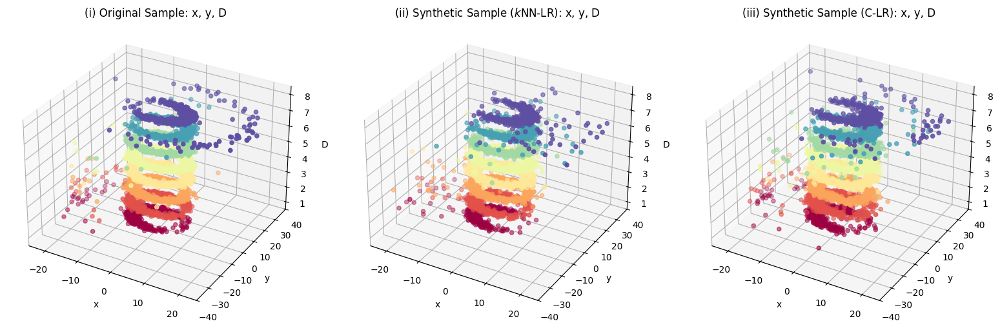

In [18]:
compareplots(discrete_data, syn3_loc, syn3_clu, ['x', 'y', 'D'], ylim=(-40, 40), xlim=(-25, 25), fig_size=(18,6))

In [19]:
from anonymeter.evaluators import *
ev1 = SinglingOutEvaluator(discrete_data, syn3_loc)
ev1.evaluate()
ev1.risk()

PrivacyRisk(value=np.float64(0.2300738206055422), ci=(np.float64(0.19338176911500068), np.float64(0.2667658720960837)))

In [20]:
ev2 = SinglingOutEvaluator(discrete_data, syn3_clu)
ev2.evaluate()
ev2.risk()

PrivacyRisk(value=np.float64(0.26976884698708015), ci=(np.float64(0.23105397343634806), np.float64(0.30848372053781226)))

## Distances

I will now compare the $k$ closest sum of eucledean distances

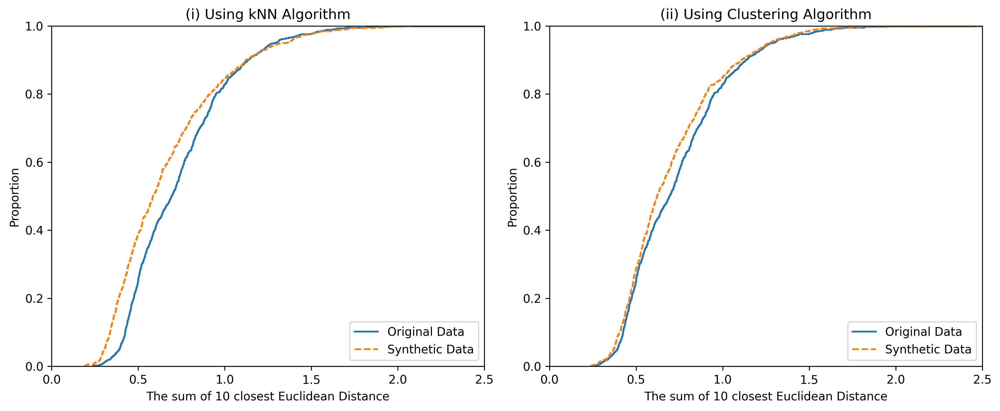

In [21]:
# I will normalise euclidean distances to std deviations metrics
variances = syn_loc_cov.data.var()
scale_factors = np.sqrt(variances)

fig, axes = plt.subplots(1, 2, figsize=(12, 5), dpi=300)

# Plot 1: using knn algorithm
sns.ecdfplot(s.tools.compute_k_distances(syn_loc_cov.data / scale_factors, K=10), 
             label='Original Data', ax=axes[0])
sns.ecdfplot(s.tools.compute_k_distances(syn_loc_cov.synthetic/ scale_factors, K=10), 
             label='Synthetic Data', linestyle='--', ax=axes[0])
axes[0].legend(loc = 'lower right')
axes[0].set_xlabel('The sum of 10 closest Euclidean Distance')
axes[0].set_title('(i) Using kNN Algorithm')
axes[0].set_xlim(0, 2.5)
# Plot 2: using clustering algorithm
sns.ecdfplot(s.tools.compute_k_distances(syn_clu_cov.data/ scale_factors, K=10),
             label='Original Data', ax=axes[1])
sns.ecdfplot(s.tools.compute_k_distances(syn_clu_cov.synthetic/ scale_factors, K=10),
             label='Synthetic Data', linestyle='--', ax=axes[1])
axes[1].legend(loc = 'lower right')
axes[1].set_xlabel('The sum of 10 closest Euclidean Distance')
axes[1].set_title('(ii) Using Clustering Algorithm')
axes[1].set_xlim(0, 2.5)
plt.savefig('../../img/circulars_kdistances.png', format='png')
plt.tight_layout()
plt.show()

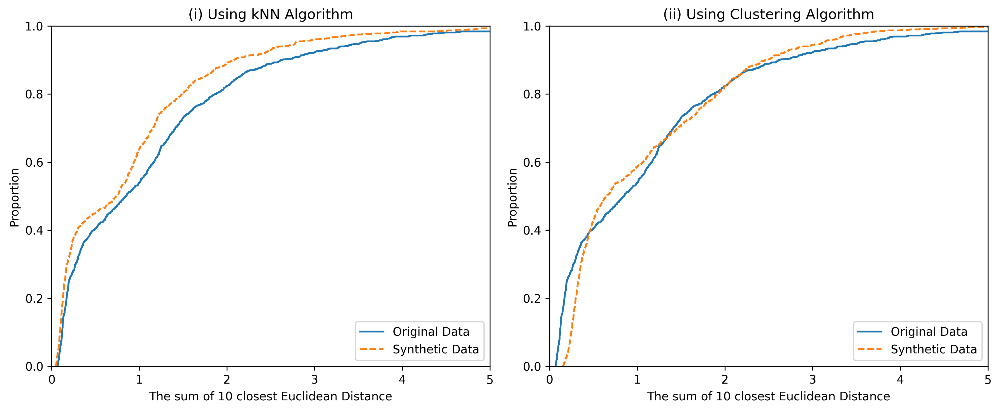

In [22]:
# I will normalise euclidean distances to std deviations metrics
variances = syn_loc_cov2.data.var()
scale_factors = np.sqrt(variances)

fig, axes = plt.subplots(1, 2, figsize=(12, 5), dpi=300)

# Plot 1: using knn algorithm
sns.ecdfplot(s.tools.compute_k_distances(syn_loc_cov2.data / scale_factors, K=10), 
             label='Original Data', ax=axes[0])
sns.ecdfplot(s.tools.compute_k_distances(syn_loc_cov2.synthetic/ scale_factors, K=10), 
             label='Synthetic Data', linestyle='--', ax=axes[0])
axes[0].legend(loc = 'lower right')
axes[0].set_xlabel('The sum of 10 closest Euclidean Distance')
axes[0].set_title('(i) Using kNN Algorithm')
axes[0].set_xlim(0, 5)
# Plot 2: using clustering algorithm
sns.ecdfplot(s.tools.compute_k_distances(syn_clu_cov2.data/ scale_factors, K=10),
             label='Original Data', ax=axes[1])
sns.ecdfplot(s.tools.compute_k_distances(syn_clu_cov2.synthetic/ scale_factors, K=10),
             label='Synthetic Data', linestyle='--', ax=axes[1])
axes[1].legend(loc = 'lower right')
axes[1].set_xlabel('The sum of 10 closest Euclidean Distance')
axes[1].set_title('(ii) Using Clustering Algorithm')
axes[1].set_xlim(0, 5)
plt.savefig('../../img/trivariate_kdistances.png', format='png')

plt.tight_layout()
plt.show()

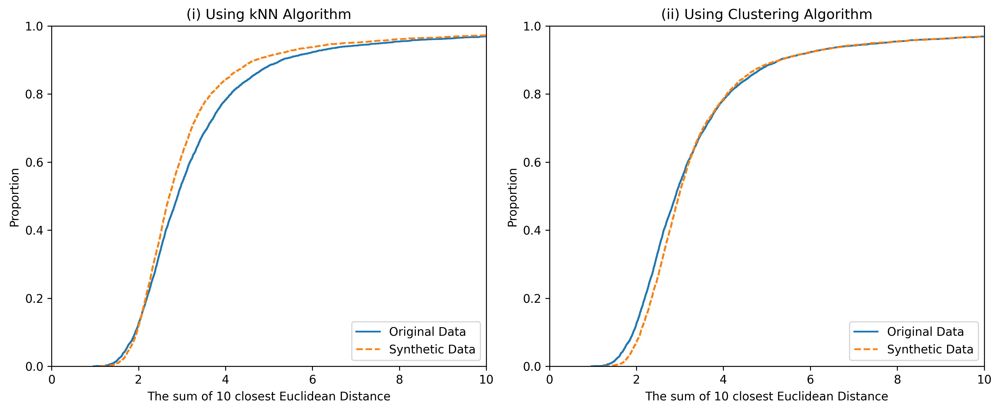

In [23]:
variances = syn_loc_cov3.data.var()
scale_factors = np.sqrt(variances)

fig, axes = plt.subplots(1, 2, figsize=(12, 5), dpi=300)
# Plot 1: using knn algorithm
sns.ecdfplot(s.tools.compute_k_distances(syn_loc_cov3.data / scale_factors, K=10), 
             label='Original Data', ax=axes[0])
sns.ecdfplot(s.tools.compute_k_distances(syn_loc_cov3.synthetic/ scale_factors, K=10),
                label='Synthetic Data', linestyle='--', ax=axes[0])
axes[0].legend(loc = 'lower right')
axes[0].set_xlabel('The sum of 10 closest Euclidean Distance')
axes[0].set_title('(i) Using kNN Algorithm')
axes[0].set_xlim(0, 10)
# Plot 2: using clustering algorithm
sns.ecdfplot(s.tools.compute_k_distances(syn_clu_cov3.data/ scale_factors, K=10),
             label='Original Data', ax=axes[1])
sns.ecdfplot(s.tools.compute_k_distances(syn_clu_cov3.synthetic/ scale_factors, K=10),
                label='Synthetic Data', linestyle='--', ax=axes[1])
axes[1].legend(loc = 'lower right')
axes[1].set_xlabel('The sum of 10 closest Euclidean Distance')
axes[1].set_title('(ii) Using Clustering Algorithm')
axes[1].set_xlim(0, 10)
plt.savefig('../../img/discrete_kdistances.png', format='png')
plt.tight_layout()
plt.show()


# Real Data: Housing Market

We replicate a real data set that contains more than three variables. We will, then, compare regression models estimated with the original and synthetic samples. The data set has median house values in California districts generated from 1990 US Census along with other explanatory variables such as median income, house age, average number of rooms/bedrooms, population, the average number of household members \citep{pace1997sparse}. 

In [24]:
housing = fetch_california_housing()
df = pd.DataFrame(housing['data'])
df.columns = housing['feature_names']
df[housing['target_names'][0]] = housing['target']
df = df[['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population',
       'AveOccup', 'MedHouseVal']]
df.to_csv('california.csv', index = False)

# Comparisons

Must run `synthpop.R` to generate results with synthpop. 

In [25]:
import subprocess

# Run the synthpop.R script
# YOU MUST UDPATE THE WORKING DIRECTORY PATH IN `synthpop.R`
subprocess.run(["Rscript", "synthpop.R"], check=True)

CompletedProcess(args=['Rscript', 'synthpop.R'], returncode=0)

The following cell will run the `synthpop.R` to create synthetic sample. 

In [26]:
dfSynthpop = pd.read_csv('california_synthpop.csv')
dfSynthpop.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,MedHouseVal
0,0.559350,4,13.638154,3.060980,992,1.633162,1.941196
1,2.518355,19,5.132203,1.035229,1334,4.299041,2.860120
2,5.136386,16,6.430178,1.046792,1247,2.420115,2.370466
3,4.869863,19,5.428801,1.048736,2696,3.646828,1.622697
4,4.170400,10,5.115579,0.932926,571,3.638169,1.754664


In [27]:
syn5 = s.LocalCov(df, K = 50)
syn5.fit()

Generating 20640 synthetic samples using 16 cores...


Generating synthetic samples: 100%|██████████| 20640/20640 [00:17<00:00, 1204.60it/s]


Synthetic sample generation complete.


,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,MedHouseVal
0,7.732777,38.244495,7.087425,1.009273,170.664105,2.422074,4.904317
1,7.506566,22.917959,7.210386,0.954759,1694.328503,2.749170,4.259378
2,7.137104,51.472897,7.463241,1.144606,580.250888,3.161209,3.566056
3,4.928962,50.824331,5.193109,0.866568,800.341320,2.713580,2.545417
4,3.957901,49.264568,6.201491,1.089994,686.281077,2.435867,3.311003
...,...,...,...,...,...,...,...
20635,2.443746,24.505550,5.462957,1.150855,950.900325,2.751110,0.785671
20636,2.168196,17.402867,6.037375,1.329895,887.150817,2.135885,0.999388
20637,1.984515,17.420146,5.546581,1.058577,949.841974,3.165728,1.090470
20638,1.891850,19.428825,5.539761,1.222625,530.666207,2.292522,0.924611


In [28]:
syn6 = s.clusterCov(df, n_clusters=100, size_min=10)
syn6.fit()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,MedHouseVal
0,5.588229,34.198434,5.824305,0.957776,641.867151,2.583127,1.873759
1,4.526285,38.332856,5.126173,0.982922,752.715696,3.101447,2.299074
2,5.095050,37.313320,6.522328,1.171673,524.619717,3.093251,1.707856
3,4.775788,34.949781,5.185139,0.934497,916.601909,3.225901,2.352411
4,5.170994,36.823146,5.318267,0.959715,932.064511,3.209220,2.227656
...,...,...,...,...,...,...,...
28,3.767988,19.906834,16.487759,3.527666,799.101377,3.001555,2.063827
29,3.632873,18.843585,19.841825,4.109187,419.254615,3.933803,2.375969
30,1.566358,32.684716,17.810792,3.902644,512.845489,2.404007,1.259716
31,1.710927,15.133817,19.193128,4.002747,3.000000,6.394278,0.933567


In [29]:
descriptives_real = df.describe().T.iloc[:,[1,2,5,3,7]].round(3)
descriptives_real.columns = ['Average', 'Std.Dev', 'Median', 'Min','Max' ]
descriptives_real.to_latex('../../tables/descriptives.tex')
descriptives_real

,Average,Std.Dev,Median,Min,Max
MedInc,3.871,1.900,3.535,0.500,15.000
HouseAge,28.639,12.586,29.000,1.000,52.000
AveRooms,5.429,2.474,5.229,0.846,141.909
AveBedrms,1.097,0.474,1.049,0.333,34.067
Population,1425.477,1132.462,1166.000,3.000,35682.000
AveOccup,3.071,10.386,2.818,0.692,1243.333
MedHouseVal,2.069,1.154,1.797,0.150,5.000


In [30]:
descriptives_syn_knn = syn5.synthetic.describe().T.iloc[:,[1,2,5,3,7]].round(3)
descriptives_syn_knn.columns = ['Average', 'Std.Dev', 'Median', 'Min','Max' ]
descriptives_syn_clu = syn6.synthetic.describe().T.iloc[:,[1,2,5,3,7]].round(3)
descriptives_syn_clu.columns = ['Average', 'Std.Dev', 'Median', 'Min','Max' ]
descriptives = pd.concat({'Synthetic: $k$NN algorithm':descriptives_syn_knn, 'Synthetic: Clustering algorithm':descriptives_syn_clu}, axis = 1)
descriptives.to_latex('../../tables/descriptives_synthetic.tex')
descriptives

Synthetic: $k$NN algorithm                                        \
                               Average   Std.Dev    Median    Min        Max   
MedInc                           3.870     1.825     3.521  0.500     15.000   
HouseAge                        28.704    12.202    28.900  1.000     52.000   
AveRooms                         5.412     1.858     5.238  0.846     54.554   
AveBedrms                        1.083     0.311     1.048  0.569      9.289   
Population                    1418.363  1017.735  1164.906  3.000  17319.600   
AveOccup                         2.918     1.117     2.866  0.692     90.400   
MedHouseVal                      2.050     1.125     1.785  0.150      5.000   

            Synthetic: Clustering algorithm                             \
                                    Average   Std.Dev    Median    Min   
MedInc                                3.868     1.899     3.527  0.500   
HouseAge                             28.601    12.451    29.044  1.000   
AveRooms                              5.413     2.323     5.224  0.846   
AveBedrms                             1.095     0.447     1.055  0.333   
Population                         1425.843  1141.538  1168.730  3.000   
AveOccup                              3.367    10.108     2.885  0.692   
MedHouseVal                           2.064     1.140     1.810  0.150   

                        
                   Max  
MedInc          15.000  
HouseAge        52.000  
AveRooms        75.061  
AveBedrms       18.250  
Population   24481.340  
AveOccup       614.691  
MedHouseVal      5.000

In [31]:
df_knn_mvn = syn5.synthetic.copy()
df_clu_mvn = syn6.synthetic.copy()
df['constant'] = 1
df_knn_mvn['constant'] = 1
df_clu_mvn['constant'] = 1
dfSynthpop['constant'] = 1
X = ['constant', 'MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup']
Y = 'MedHouseVal'


# implemented following the SDV documentation: 
# https://docs.sdv.dev/sdv/single-table-data/modeling/synthesizers/gaussiancopulasynthesizer

mdata = Metadata.detect_from_dataframe(df)
fastml = GaussianCopulaSynthesizer(mdata)
fastml.fit(df)
dfSDV = fastml.sample(df.shape[0])

c:\Users\mq10007470\AppData\Local\anaconda3\envs\anzjs\Lib\site-packages\sdv\single_table\base.py:134: UserWarning:

We strongly recommend saving the metadata using 'save_to_json' for replicability in future SDV versions.



In [32]:
ctgan = CTGANSynthesizer(mdata)
ctgan.fit(df)
dfCTGAN = ctgan.sample(df.shape[0])

In [33]:
tvae = TVAESynthesizer(mdata)
tvae.fit(df)
dfTVAE = tvae.sample(df.shape[0])

In [34]:
original = sm.OLS(df[Y], df[X]).fit()
knn_mvn = sm.OLS(df_knn_mvn[Y], df_knn_mvn[X]).fit()
cluster_mvn = sm.OLS(df_clu_mvn[Y], df_clu_mvn[X]).fit()
sdvv= sm.OLS(dfSDV[Y], dfSDV[X]).fit()
ctg = sm.OLS(dfCTGAN[Y], dfCTGAN[X]).fit()
tva = sm.OLS(dfTVAE[Y], dfTVAE[X]).fit()
synthpop = sm.OLS(dfSynthpop[Y], dfSynthpop[X]).fit()

In [35]:
reg_table = summary_col([original, knn_mvn,cluster_mvn, synthpop, sdvv, ctg, tva], 
model_names= ['Original', '$k$NN-LR Resmapling', 'C-LR Resmapling',  'Synthpop', 'FAST ML', 'CTGAN', 'TVAE'],
stars = True,
float_format='%.4f')
reg_table

,Original,$k$NN-LR Resmapling,C-LR Resmapling,Synthpop,FAST ML,CTGAN,TVAE
constant,-0.4391***,-0.4766***,-0.4001***,0.0104,0.4885***,0.4105***,-0.2535***
,(0.0276),(0.0327),(0.0279),(0.0263),(0.0413),(0.0480),(0.0409)
MedInc,0.5369***,0.6139***,0.5331***,0.4566***,0.4980***,0.3095***,0.6137***
,(0.0041),(0.0041),(0.0041),(0.0034),(0.0040),(0.0033),(0.0032)
HouseAge,0.0165***,0.0180***,0.0165***,0.0164***,0.0124***,0.0073***,0.0235***
,(0.0005),(0.0004),(0.0005),(0.0005),(0.0004),(0.0005),(0.0004)
AveRooms,-0.2117***,-0.3088***,-0.2210***,-0.0851***,-0.2001***,0.1190***,-0.0795***
,(0.0060),(0.0063),(0.0060),(0.0042),(0.0051),(0.0040),(0.0029)
AveBedrms,0.9937***,1.5166***,1.0009***,0.3262***,0.7115***,-0.3427***,0.3567***
,(0.0295),(0.0340),(0.0290),(0.0174),(0.0319),(0.0299),(0.0299)


In [36]:
print(reg_table.as_latex())

\begin{table}
\caption{}
\label{}
\begin{center}
\begin{tabular}{llllllll}
\hline
               & Original   & \$k\$NN-LR Resmapling & C-LR Resmapling & Synthpop   & FAST ML    & CTGAN      & TVAE        \\
\hline
constant       & -0.4391*** & -0.4766***            & -0.4001***      & 0.0104     & 0.4885***  & 0.4105***  & -0.2535***  \\
               & (0.0276)   & (0.0327)              & (0.0279)        & (0.0263)   & (0.0413)   & (0.0480)   & (0.0409)    \\
MedInc         & 0.5369***  & 0.6139***             & 0.5331***       & 0.4566***  & 0.4980***  & 0.3095***  & 0.6137***   \\
               & (0.0041)   & (0.0041)              & (0.0041)        & (0.0034)   & (0.0040)   & (0.0033)   & (0.0032)    \\
HouseAge       & 0.0165***  & 0.0180***             & 0.0165***       & 0.0164***  & 0.0124***  & 0.0073***  & 0.0235***   \\
               & (0.0005)   & (0.0004)              & (0.0005)        & (0.0005)   & (0.0004)   & (0.0005)   & (0.0004)    \\
AveRooms       & -0.2117*** &

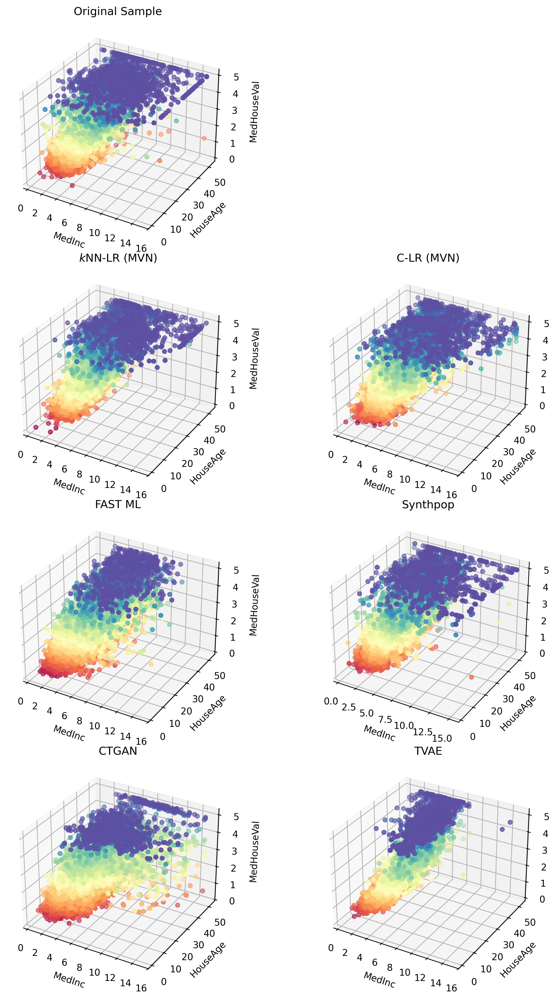

In [37]:
x, y, z = ('MedInc', 'HouseAge', 'MedHouseVal')

fig = plt.figure(dpi = 300, figsize= (10,15))
ax1 = fig.add_subplot(421, projection='3d')
ax1.set_title('Original Sample')
ax1.scatter(df[x], df[y], df[z], c=df[z], cmap="Spectral")
ax1.set_xlabel(x)
ax1.set_ylabel(y)
ax1.set_zlabel(z)

ax2 = fig.add_subplot(423, projection='3d')
ax2.set_title('$k$NN-LR (MVN)')
ax2.scatter(df_knn_mvn[x], df_knn_mvn[y], df_knn_mvn[z], c=df_knn_mvn[z], cmap="Spectral")
ax2.set_xlabel(x)
ax2.set_ylabel(y)
ax2.set_zlabel(z)

ax3 = fig.add_subplot(424, projection='3d')
ax3.set_title('C-LR (MVN)')
ax3.scatter(df_clu_mvn[x], df_clu_mvn[y], df_clu_mvn[z], c=df_clu_mvn[z], cmap="Spectral")
ax3.set_xlabel(x)
ax3.set_ylabel(y)
ax3.set_zlabel(z)


ax4 = fig.add_subplot(425, projection='3d')
ax4.set_title('FAST ML')
ax4.scatter(dfSDV[x], dfSDV[y], dfSDV[z], c=dfSDV[z], cmap="Spectral")
ax4.set_xlabel(x)
ax4.set_ylabel(y)
ax4.set_zlabel(z)

ax5 = fig.add_subplot(426, projection='3d')
ax5.set_title('Synthpop')
ax5.scatter(dfSynthpop[x], dfSynthpop[y], dfSynthpop[z], c=dfSynthpop[z], cmap="Spectral")
ax5.set_xlabel(x)
ax5.set_ylabel(y)
ax5.set_zlabel(z)

ax6 = fig.add_subplot(427, projection='3d')
ax6.set_title('CTGAN')
ax6.scatter(dfCTGAN[x], dfCTGAN[y], dfCTGAN[z], c=dfCTGAN[z], cmap="Spectral")
ax6.set_xlabel(x)
ax6.set_ylabel(y)
ax6.set_zlabel(z)

ax7 = fig.add_subplot(428, projection='3d')
ax7.set_title('TVAE')
ax7.scatter(dfTVAE[x], dfTVAE[y], dfTVAE[z], c=dfTVAE[z], cmap="Spectral")
ax7.set_xlabel(x)
ax7.set_ylabel(y)
ax7.set_zlabel(z)

plt.tight_layout()
plt.savefig('../../img/localcov_fastML_synthpop.png', bbox_inches='tight')
plt.show()


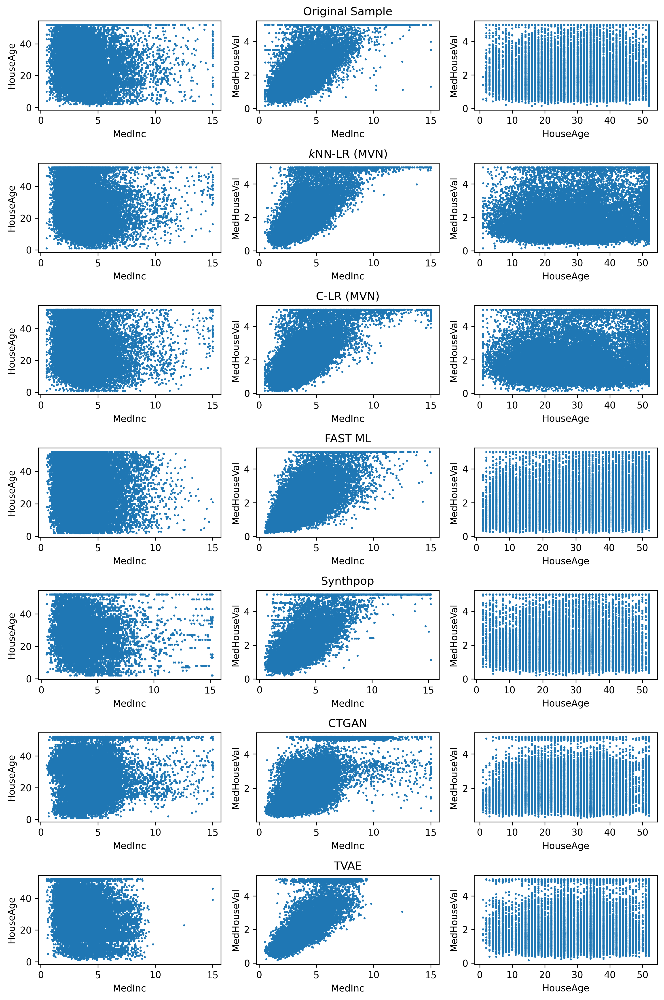

In [38]:
fig, ax = plt.subplots(7, 3, figsize=(10, 15), dpi = 300)
ax[0,0].scatter(df[x], df[y], s = 1.5)
ax[0,1].scatter(df[x], df[z], s = 1.5)
ax[0,2].scatter(df[y], df[z], s = 1.5)
ax[1,0].scatter(df_knn_mvn[x], df_knn_mvn[y], s = 1.5)
ax[1,1].scatter(df_knn_mvn[x], df_knn_mvn[z], s = 1.5)
ax[1,2].scatter(df_knn_mvn[y], df_knn_mvn[z], s = 1.5)
ax[2,0].scatter(df_clu_mvn[x], df_clu_mvn[y], s = 1.5)
ax[2,1].scatter(df_clu_mvn[x], df_clu_mvn[z], s = 1.5)
ax[2,2].scatter(df_clu_mvn[y], df_clu_mvn[z], s = 1.5)
ax[3,0].scatter(dfSDV[x], dfSDV[y], s = 1.5)
ax[3,1].scatter(dfSDV[x], dfSDV[z], s = 1.5)
ax[3,2].scatter(dfSDV[y], dfSDV[z], s = 1.5)
ax[4,0].scatter(dfSynthpop[x], dfSynthpop[y], s = 1.5)
ax[4,1].scatter(dfSynthpop[x], dfSynthpop[z], s = 1.5)
ax[4,2].scatter(dfSynthpop[y], dfSynthpop[z], s = 1.5)
ax[5,0].scatter(dfCTGAN[x], dfCTGAN[y], s = 1.5)
ax[5,1].scatter(dfCTGAN[x], dfCTGAN[z], s = 1.5)
ax[5,2].scatter(dfCTGAN[y], dfCTGAN[z], s = 1.5)
ax[6,0].scatter(dfTVAE[x], dfTVAE[y], s = 1.5)
ax[6,1].scatter(dfTVAE[x], dfTVAE[z], s = 1.5)
ax[6,2].scatter(dfTVAE[y], dfTVAE[z], s = 1.5)
for i in range(7):
    ax[i,0].set_xlabel(x)
    ax[i,1].set_xlabel(x)
    ax[i,2].set_xlabel(y)
    ax[i,0].set_ylabel(y)
    ax[i,1].set_ylabel(z)
    ax[i,2].set_ylabel(z)
# set title for each row
ax[0,1].set_title('Original Sample')
ax[1,1].set_title('$k$NN-LR (MVN)')
ax[2,1].set_title('C-LR (MVN)')
ax[3,1].set_title('FAST ML')
ax[4,1].set_title('Synthpop')
ax[5,1].set_title('CTGAN')
ax[6,1].set_title('TVAE')
plt.tight_layout()
plt.savefig('../../img/localcov_fastML_synthpop_2d.png', bbox_inches='tight')
plt.show()


## Singling out risks

In [62]:
ev_loc_cov = SinglingOutEvaluator(df, df_knn_mvn)
ev_loc_cov.evaluate()
ev_loc_clu = SinglingOutEvaluator(df, df_clu_mvn)
ev_loc_clu.evaluate()
ev_synthpop = SinglingOutEvaluator(df, dfSynthpop)
ev_synthpop.evaluate()
ev_fastml = SinglingOutEvaluator(df, dfSDV)
ev_fastml.evaluate()
ev_ctgan = SinglingOutEvaluator(df, dfCTGAN)
ev_ctgan.evaluate()
ev_tvae = SinglingOutEvaluator(df, dfTVAE)
ev_tvae.evaluate()

In [63]:
print("Risk of Local Covariance with MVN:", ev_loc_cov.risk())
print("Risk of Cluster Covariance with MVN:", ev_loc_clu.risk())
print("Risk of Synthpop:", ev_synthpop.risk())
print("Risk of FAST ML:", ev_fastml.risk())
print("Risk of CTGAN:", ev_ctgan.risk())
print("Risk of TVAE:", ev_tvae.risk())

Risk of Local Covariance with MVN: PrivacyRisk(value=np.float64(0.13877525992800502), ci=(np.float64(0.10871544340723721), np.float64(0.16883507644877283)))
Risk of Cluster Covariance with MVN: PrivacyRisk(value=np.float64(0.1903787942240043), ci=(np.float64(0.15617996413496654), np.float64(0.22457762431304207)))
Risk of Synthpop: PrivacyRisk(value=np.float64(0.1923635455430812), ci=(np.float64(0.1580273788297291), np.float64(0.2266997122564333)))
Risk of FAST ML: PrivacyRisk(value=np.float64(0.22213481532923463), ci=(np.float64(0.18590093257162363), np.float64(0.2583686980868456)))
Risk of CTGAN: PrivacyRisk(value=np.float64(0.1883940429049274), ci=(np.float64(0.1543339917500702), np.float64(0.22245409405978459)))
Risk of TVAE: PrivacyRisk(value=np.float64(0.10900399014185158), ci=(np.float64(0.08195705027297033), np.float64(0.13605093001073282)))


In [64]:
print(1-KSComplement.compute(df, df_knn_mvn))
print(1-KSComplement.compute(df, df_clu_mvn))
print(1-KSComplement.compute(df, dfSynthpop))
print(1-KSComplement.compute(df, dfSDV))
print(1-KSComplement.compute(df, dfCTGAN))
print(1-KSComplement.compute(df, dfTVAE))

0.026047722868217105
0.027004602713178283
0.011615794573643479
0.08557412790697683
0.06626695736434107
0.05995033914728676


In [65]:
print(CorrelationSimilarity.compute(df.drop(columns=['constant']), df_knn_mvn.drop(columns=['constant'])))
print(CorrelationSimilarity.compute(df.drop(columns=['constant']), df_clu_mvn.drop(columns=['constant'])))
print(CorrelationSimilarity.compute(df.drop(columns=['constant']), dfSynthpop.drop(columns=['constant'])))
print(CorrelationSimilarity.compute(df.drop(columns=['constant']), dfSDV.drop(columns=['constant'])))
print(CorrelationSimilarity.compute(df.drop(columns=['constant']), dfCTGAN.drop(columns=['constant'])))
print(CorrelationSimilarity.compute(df.drop(columns=['constant']), dfTVAE.drop(columns=['constant'])))

0.9786953270618748
0.990482913844878
0.9917315723891191
0.9572626775211474
0.9257641378761325
0.9538495886495991


In [68]:

models = [
    ("$k$NN-LR",  ev_loc_cov,  ("syn3_loc",  df_knn_mvn)),
    ("C-LR",ev_loc_clu,  ("syn3_clu",  df_clu_mvn)),
    ("Synthpop",                ev_synthpop, ("discrete",  dfSynthpop)),
    ("GCS",                 ev_fastml,   ("fastml_dis",dfSDV)),
    ("CTGAN",                   ev_ctgan,    ("ctgan_dis", dfCTGAN)),
    ("TVAE",                    ev_tvae,     ("tvae_dis",  dfTVAE)),
]

rows = []
for name, evaluator, (syn_name, syn_data) in models:
    rows.append({
        "Model": name,
        "Singling out risk": evaluator.risk()[0],
        "Similarity to marginal distribution": KSComplement.compute(df.drop(columns=['constant']), 
                                                                    syn_data.drop(columns=['constant'])),
        "Correlation similarity": CorrelationSimilarity.compute(df.drop(columns=['constant']), 
                                                                syn_data.drop(columns=['constant'])),
        "Computation time": 1  # placeholder
    })

comparisontable = pd.DataFrame(rows)

# Optional: sorting or rounding
# df = df.round({"Singling out risk": 3,
#                "Similarity to marginal distribution": 3,
#                "Correlation similarity": 3})

comparisontable = comparisontable.to_latex(index=False, float_format="%.3f", column_format="lcccc")
print(comparisontable)


\begin{tabular}{lcccc}
\toprule
Model & Singling out risk & Similarity to marginal distribution & Correlation similarity & Computation time \\
\midrule
$k$NN-LR & 0.139 & 0.970 & 0.979 & 1 \\
C-LR & 0.190 & 0.969 & 0.990 & 1 \\
Synthpop & 0.192 & 0.987 & 0.992 & 1 \\
GCS & 0.222 & 0.902 & 0.957 & 1 \\
CTGAN & 0.188 & 0.924 & 0.926 & 1 \\
TVAE & 0.109 & 0.931 & 0.954 & 1 \\
\bottomrule
\end{tabular}



## How well synthpop perform with non-convex distributions?

In [43]:
circulars = pd.read_csv('circulars_synthpop.csv')
trivariate = pd.read_csv('trivariate_synthpop.csv')
discrete = pd.read_csv('discrete_data_synthpop.csv')

In [44]:
mdata_circulars = Metadata.detect_from_dataframe(circulars)
fastml_bi = GaussianCopulaSynthesizer(mdata_circulars)
fastml_bi.fit(data)
fastml_bi = fastml_bi.sample(data.shape[0])

c:\Users\mq10007470\AppData\Local\anaconda3\envs\anzjs\Lib\site-packages\sdv\single_table\base.py:134: UserWarning:

We strongly recommend saving the metadata using 'save_to_json' for replicability in future SDV versions.



In [45]:
mdata_trivariate = Metadata.detect_from_dataframe(trivariate)
fastml_tri = GaussianCopulaSynthesizer(mdata_trivariate)
fastml_tri.fit(data2)
fastml_tri = fastml_tri.sample(data2.shape[0])

c:\Users\mq10007470\AppData\Local\anaconda3\envs\anzjs\Lib\site-packages\sdv\single_table\base.py:134: UserWarning:

We strongly recommend saving the metadata using 'save_to_json' for replicability in future SDV versions.



In [46]:
mdata_discrete = Metadata.detect_from_dataframe(discrete_data)
fastml_dis = GaussianCopulaSynthesizer(mdata_discrete)
fastml_dis.fit(discrete_data)
fastml_dis = fastml_dis.sample(discrete_data.shape[0])

c:\Users\mq10007470\AppData\Local\anaconda3\envs\anzjs\Lib\site-packages\sdv\single_table\base.py:134: UserWarning:

We strongly recommend saving the metadata using 'save_to_json' for replicability in future SDV versions.



In [47]:
ctgan_bi = CTGANSynthesizer(mdata_circulars)
ctgan_bi.fit(data)
ctgan_bi = ctgan_bi.sample(data.shape[0])

In [48]:
ctgan_tri = CTGANSynthesizer(mdata_trivariate)
ctgan_tri.fit(data2)
ctgan_tri = ctgan_tri.sample(data2.shape[0])

In [49]:
ctgan_dis = CTGANSynthesizer(mdata_discrete)
ctgan_dis.fit(discrete_data)
ctgan_dis = ctgan_dis.sample(discrete_data.shape[0])

In [50]:
tvae_bi = TVAESynthesizer(mdata_circulars)
tvae_bi.fit(data)
tvae_bi = tvae_bi.sample(data.shape[0])

In [51]:
tvae_tri = TVAESynthesizer(mdata_trivariate)
tvae_tri.fit(data2)
tvae_tri = tvae_tri.sample(data2.shape[0])

In [52]:
tvae_dis = TVAESynthesizer(mdata_discrete)
tvae_dis.fit(discrete_data)
tvae_dis = tvae_dis.sample(discrete_data.shape[0])

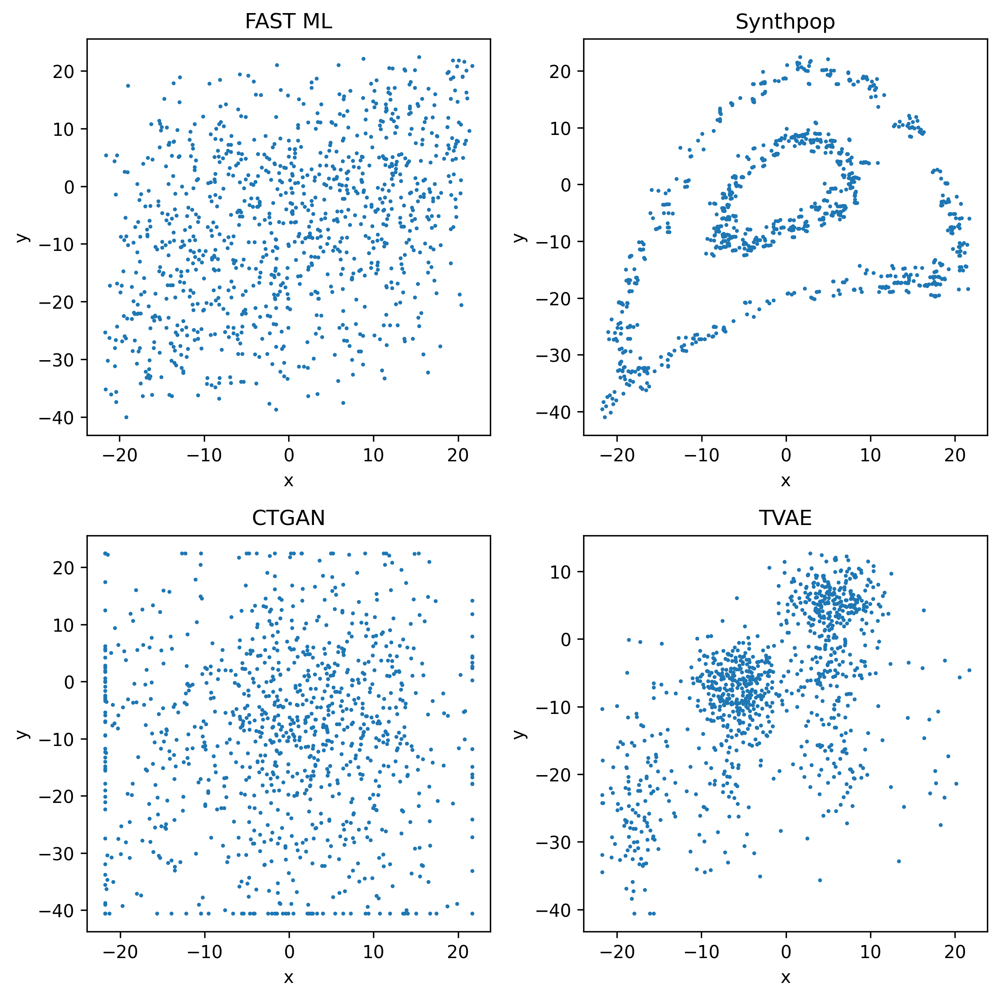

In [53]:
fig, ax = plt.subplots(2,2, figsize = (8,8), dpi = 300)
ax[0,0].scatter(fastml_bi.x, fastml_bi.y, s = 1.5)
ax[0,0].set_title('FAST ML')
ax[0,1].scatter(circulars.x, circulars.y, s = 1.5)
ax[0,1].set_title('Synthpop')
ax[1,0].scatter(ctgan_bi.x, ctgan_bi.y, s = 1.5)
ax[1,0].set_title('CTGAN')
ax[1,1].scatter(tvae_bi.x, tvae_bi.y, s = 1.5)
ax[1,1].set_title('TVAE')
for i in range(2):
    for j in range(2):
        ax[i,j].set_xlabel('x')
        ax[i,j].set_ylabel('y')
plt.tight_layout()
plt.savefig('../../img/circulars_synthpop.png', bbox_inches='tight', format = 'png')
plt.show()

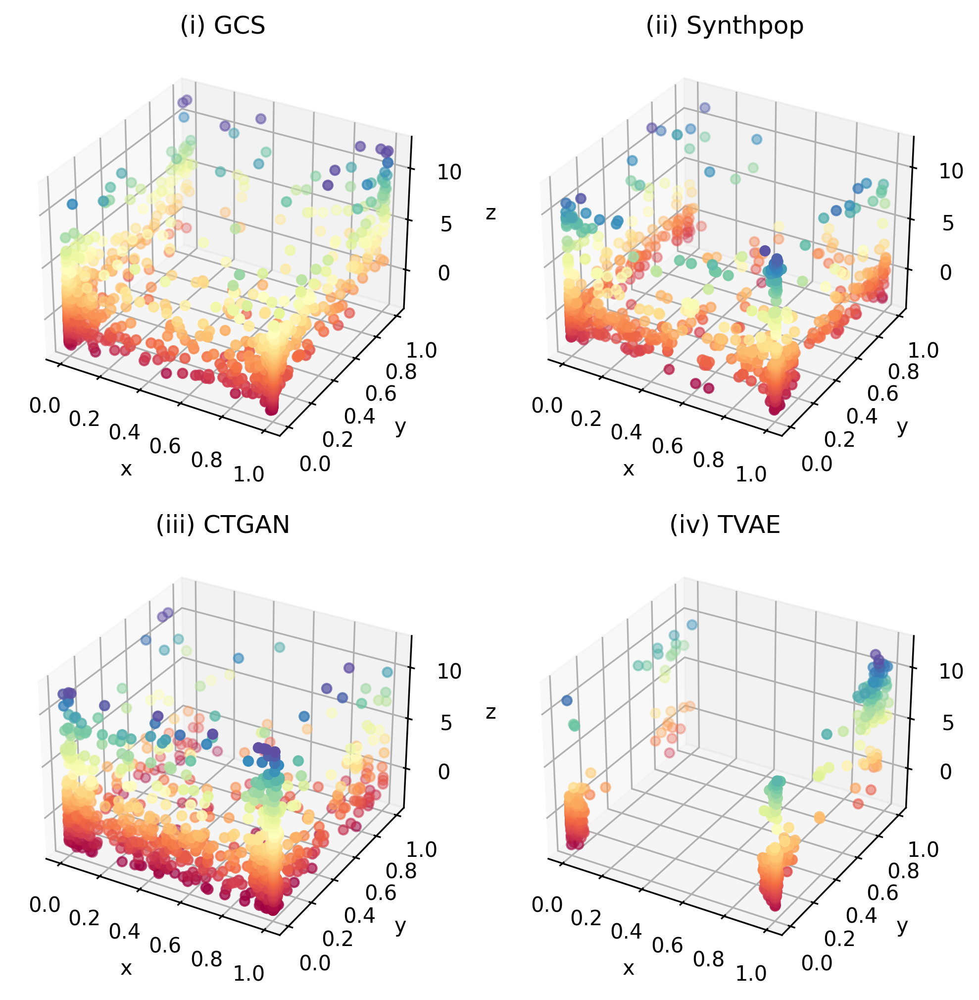

In [54]:
fig = plt.figure(dpi = 300, figsize= (8,8))
ax1 = fig.add_subplot(221, projection='3d')
ax1.set_title('(i) GCS')
ax1.scatter(fastml_tri.x, fastml_tri.y, fastml_tri.z, c=fastml_tri.z, cmap="Spectral")
ax1.set_xlabel('x')
ax1.set_ylabel('y')
ax1.set_zlabel('z')
ax2 = fig.add_subplot(222, projection='3d')
ax2.scatter(trivariate.x, trivariate.y, trivariate.z, c=trivariate.z, cmap="Spectral")
ax2.set_title('(ii) Synthpop')
ax2.set_xlabel('x')
ax2.set_ylabel('y')
ax2.set_zlabel('z')
ax3 = fig.add_subplot(223, projection='3d')
ax3.scatter(ctgan_tri.x, ctgan_tri.y, ctgan_tri.z, c=ctgan_tri.z, cmap="Spectral")
ax3.set_title('(iii) CTGAN')
ax3.set_xlabel('x')
ax3.set_ylabel('y')
ax3.set_zlabel('z')
ax4 = fig.add_subplot(224, projection='3d')
ax4.scatter(tvae_tri.x, tvae_tri.y, tvae_tri.z, c=tvae_tri.z, cmap="Spectral")
ax4.set_title('(iv) TVAE')
ax4.set_xlabel('x')
ax4.set_ylabel('y')
ax4.set_zlabel('z')
plt.savefig('../../img/trivariate_synthpop.png', bbox_inches='tight', format = 'png')
plt.show()

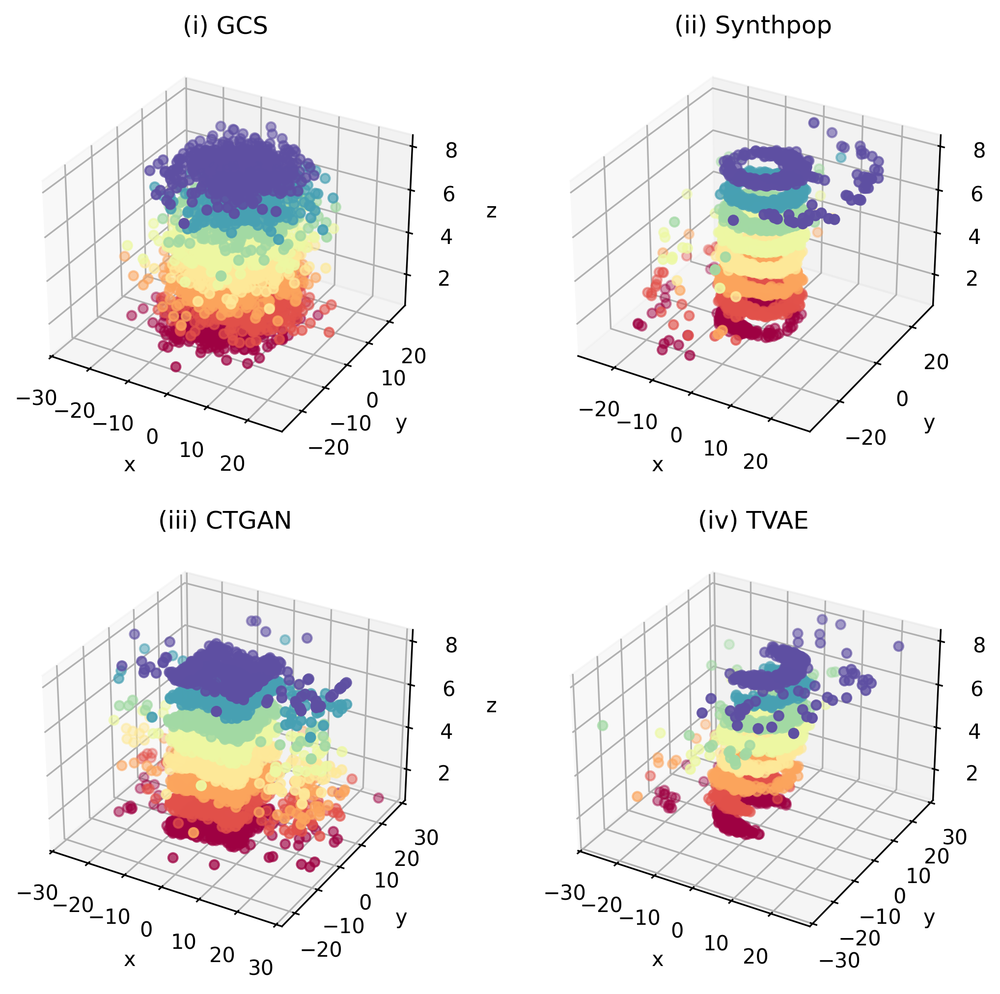

In [55]:
fig = plt.figure(dpi = 300, figsize= (8,8))
ax1 = fig.add_subplot(221, projection='3d')
ax1.set_title('(i) GCS')
ax1.scatter(fastml_dis.x, fastml_dis.y, fastml_dis.D, c=fastml_dis.D, cmap="Spectral")
ax1.set_xlabel('x')
ax1.set_ylabel('y')
ax1.set_zlabel('z')
ax2 = fig.add_subplot(222, projection='3d')
ax2.scatter(discrete.x, discrete.y, discrete.D, c=discrete.D, cmap="Spectral")
ax2.set_title('(ii) Synthpop')
ax2.set_xlabel('x')
ax2.set_ylabel('y')
ax2.set_zlabel('z')
ax3 = fig.add_subplot(223, projection='3d')
ax3.scatter(ctgan_dis.x, ctgan_dis.y, ctgan_dis.D, c=ctgan_dis.D, cmap="Spectral")
ax3.set_title('(iii) CTGAN')
ax3.set_xlabel('x')
ax3.set_ylabel('y')
ax3.set_zlabel('z')
ax4 = fig.add_subplot(224, projection='3d')
ax4.scatter(tvae_dis.x, tvae_dis.y, tvae_dis.D, c=tvae_dis.D, cmap="Spectral")
ax4.set_title('(iv) TVAE')
ax4.set_xlabel('x')
ax4.set_ylabel('y')
ax4.set_zlabel('z')
plt.subplots_adjust(wspace=0.1, right=0.98)
plt.savefig('../../img/discrete_comparison.png', bbox_inches='tight', format = 'png')
plt.show()

In [56]:
ev_loc_cov = SinglingOutEvaluator(discrete_data, syn3_loc)
ev_loc_cov.evaluate()
ev_loc_clu = SinglingOutEvaluator(discrete_data, syn3_clu)
ev_loc_clu.evaluate()
ev_synthpop = SinglingOutEvaluator(discrete_data, discrete)
ev_synthpop.evaluate()
ev_fastml = SinglingOutEvaluator(discrete_data, fastml_dis)
ev_fastml.evaluate()
ev_ctgan = SinglingOutEvaluator(discrete_data, ctgan_dis)
ev_ctgan.evaluate()
ev_tvae = SinglingOutEvaluator(discrete_data, tvae_dis)
ev_tvae.evaluate()


In [57]:
print("Risk of Local Covariance with MVN:", ev_loc_cov.risk())
print("Risk of Cluster Covariance with MVN:", ev_loc_clu.risk())
print("Risk of Synthpop:", ev_synthpop.risk())
print("Risk of FAST ML:", ev_fastml.risk())
print("Risk of CTGAN:", ev_ctgan.risk())
print("Risk of TVAE:", ev_tvae.risk())


Risk of Local Covariance with MVN: PrivacyRisk(value=np.float64(0.22808906928646533), ci=(np.float64(0.191509780865554), np.float64(0.2646683577073766)))
Risk of Cluster Covariance with MVN: PrivacyRisk(value=np.float64(0.25786033907261874), ci=(np.float64(0.2197077081917188), np.float64(0.29601296995351867)))
Risk of Synthpop: PrivacyRisk(value=np.float64(0.2320585719246191), ci=(np.float64(0.19525492517447038), np.float64(0.2688622186747678)))
Risk of FAST ML: PrivacyRisk(value=np.float64(0.07526321771754436), ci=(np.float64(0.0524580314181262), np.float64(0.09806840401696253)))
Risk of CTGAN: PrivacyRisk(value=np.float64(0.12488200069446675), ci=(np.float64(0.09615927831509372), np.float64(0.1536047230738398)))
Risk of TVAE: PrivacyRisk(value=np.float64(0.1546532704806202), ci=(np.float64(0.12319239267380164), np.float64(0.18611414828743875)))


In [58]:
print(1-KSComplement.compute(discrete_data, syn3_loc))
print(1-KSComplement.compute(discrete_data, syn3_clu))
print(1-KSComplement.compute(discrete_data, discrete))
print(1-KSComplement.compute(discrete_data, fastml_dis))
print(1-KSComplement.compute(discrete_data, ctgan_dis))
print(1-KSComplement.compute(discrete_data, tvae_dis))

0.016759999999999997
0.014760000000000106
0.00983999999999996
0.05460000000000009
0.06720000000000004
0.06500000000000006


c:\Users\mq10007470\AppData\Local\anaconda3\envs\anzjs\Lib\site-packages\scipy\stats\_axis_nan_policy.py:579: RuntimeWarning:

ks_2samp: Exact calculation unsuccessful. Switching to method=asymp.



In [59]:
print(CorrelationSimilarity.compute(discrete_data, syn3_loc))
print(CorrelationSimilarity.compute(discrete_data, syn3_clu))
print(CorrelationSimilarity.compute(discrete_data, discrete))
print(CorrelationSimilarity.compute(discrete_data, fastml_dis))
print(CorrelationSimilarity.compute(discrete_data, ctgan_dis))
print(CorrelationSimilarity.compute(discrete_data, tvae_dis))

0.9947952008454871
0.9972094964005214
0.9830341029073659
0.9593186351416965
0.954401483581471
0.9520609493408445


In [61]:

models = [
    ("$k$NN-LR",  ev_loc_cov,  ("syn3_loc",  syn3_loc)),
    ("C-LR",ev_loc_clu,  ("syn3_clu",  syn3_clu)),
    ("Synthpop",                ev_synthpop, ("discrete",  discrete)),
    ("GCS",                 ev_fastml,   ("fastml_dis",fastml_dis)),
    ("CTGAN",                   ev_ctgan,    ("ctgan_dis", ctgan_dis)),
    ("TVAE",                    ev_tvae,     ("tvae_dis",  tvae_dis)),
]

rows = []
for name, evaluator, (syn_name, syn_data) in models:
    rows.append({
        "Model": name,
        "Singling out risk": evaluator.risk()[0],
        "Similarity to marginal distribution": KSComplement.compute(discrete_data, syn_data),
        "Correlation similarity": CorrelationSimilarity.compute(discrete_data, syn_data),
        "Computation time": 1  # placeholder
    })

comparisontable = pd.DataFrame(rows)

# Optional: sorting or rounding
# df = df.round({"Singling out risk": 3,
#                "Similarity to marginal distribution": 3,
#                "Correlation similarity": 3})

comparisontable = comparisontable.to_latex(index=False, float_format="%.3f", column_format="lcccc")
print(comparisontable)


c:\Users\mq10007470\AppData\Local\anaconda3\envs\anzjs\Lib\site-packages\scipy\stats\_axis_nan_policy.py:579: RuntimeWarning:

ks_2samp: Exact calculation unsuccessful. Switching to method=asymp.



\begin{tabular}{lcccc}
\toprule
Model & Singling out risk & Similarity to marginal distribution & Correlation similarity & Computation time \\
\midrule
$k$NN-LR & 0.228 & 0.983 & 0.995 & 1 \\
C-LR & 0.258 & 0.985 & 0.997 & 1 \\
Synthpop & 0.232 & 0.990 & 0.983 & 1 \\
GCS & 0.075 & 0.945 & 0.959 & 1 \\
CTGAN & 0.125 & 0.933 & 0.954 & 1 \\
TVAE & 0.155 & 0.935 & 0.952 & 1 \\
\bottomrule
\end{tabular}



# MC Simulation

In [60]:
PY = r"C:\Users\mq10007470\AppData\Local\anaconda3\envs\anzjs\python.exe"
SCRIPT = r"C:\Users\mq10007470\Dropbox\Research\synthetic data\Codes\assets\mc_simulation.py"

# Suppress any prints from the script so only JSON is emitted
WRAP = """
import sys,runpy,io,contextlib
sys.argv=[r'%s']+sys.argv[1:]
buf=io.StringIO()
with contextlib.redirect_stdout(buf), contextlib.redirect_stderr(buf):
    g=runpy.run_path(r'%s', run_name='__main__')
print(g['results'].to_json(orient='records'))
""" % (SCRIPT, SCRIPT)

frames = []
for k in range(10, 51, 5): 
    print(k)
    out = subprocess.check_output([PY, "-c", WRAP, "--n", "100", "--k", str(k)], text=True).strip()
    frames.append(pd.DataFrame(json.loads(out)))

all_results = pd.concat(frames, ignore_index=True)
all_results.head()

10
15
20
25
30
35
40
45
50


,simulation,risk,utility,correlation,k
0,0,0.285647,0.98904,0.995379,10
1,1,0.239998,0.99008,0.995860,10
2,2,0.279693,0.99032,0.994595,10
3,3,0.245952,0.98940,0.995651,10
4,4,0.289616,0.98916,0.996717,10


In [61]:
latex_table = all_results.groupby("k").mean()
#drop simulation column
latex_table = latex_table.drop(columns=["simulation"])
latex_table.to_latex('mc_simulation_sdv.tex')

# END